# Cart Pole
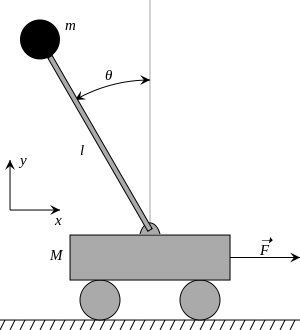

## 1. CartPole Pendulum Simulation without external control.

This simulation models a CartPole system without any external control. It demonstrates how a pendulum behaves when mounted on a small cart, given an initial tilt. The system evolves purely according to the laws of classical mechanics.

Let's make the cart pole simulation with the system parameters below:
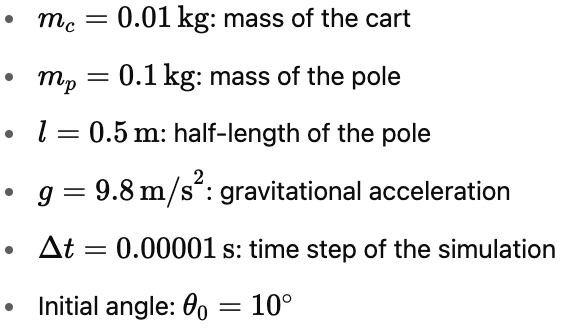

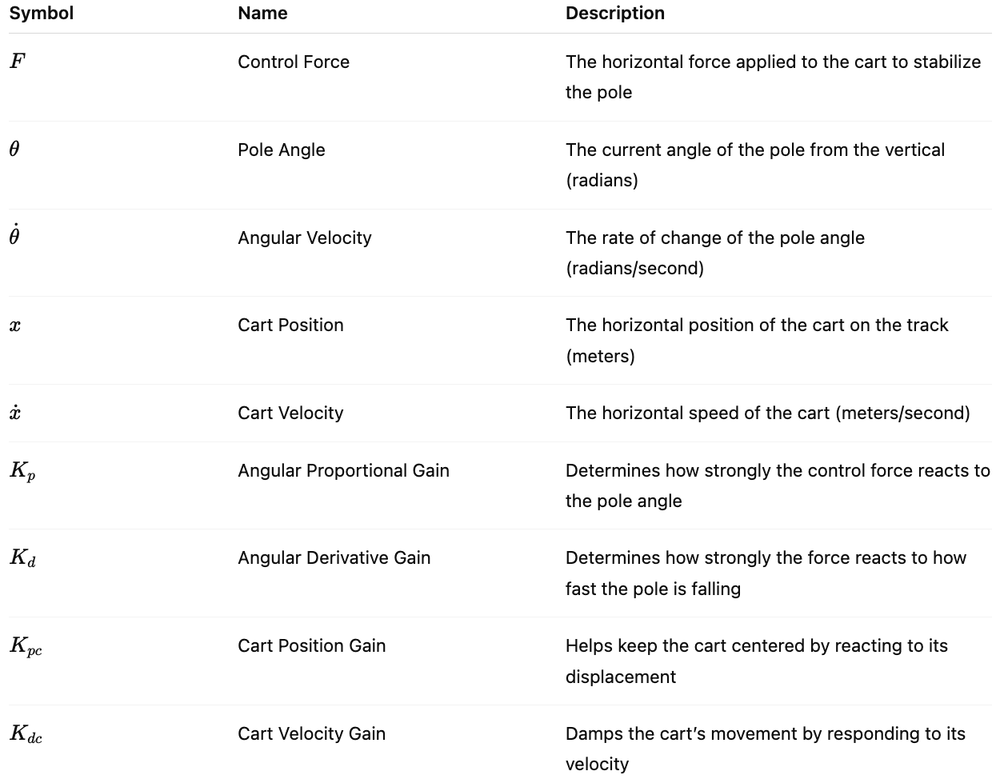

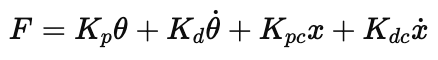

In [1]:
!pip install stable-baselines3[extra] pygame


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 965.4/965.4 kB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.5/184.5 kB 15.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-

# Intro to Reinforcement Learning

CartPole simulation을 위한 예시


In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# -------------------------------
# CartPole 모델 (더 촘촘한 시뮬레이션: dt = 0.002)
# -------------------------------
class CartPole:
    def __init__(self):
        self.g = 9.8
        self.mc = 0.01
        self.mp = 0.1
        self.l = 0.5  # half pole length
        self.dt = 0.001  # 더 촘촘한 시간 간격 -> 0.00001
        self.total_mass = self.mc + self.mp
        self.pml = self.mp * self.l
        self.reset()

    def reset(self):
        self.state = np.array([0.0, 0.0, np.deg2rad(10), 0.0]) # 초기 각도 10도로 초기화
        return self.state

    def step(self, force=0.0):
        x, x_dot, theta, theta_dot = self.state
        costheta = np.cos(theta)
        sintheta = np.sin(theta)
        temp = (force + self.pml * theta_dot**2 * sintheta) / self.total_mass
        thetaacc = (self.g * sintheta - costheta * temp) / (
            self.l * (4.0/3.0 - self.mp * costheta**2 / self.total_mass)
        )
        xacc = temp - self.pml * thetaacc * costheta / self.total_mass

        x += self.dt * x_dot
        x_dot += self.dt * xacc
        theta += self.dt * theta_dot
        theta_dot += self.dt * thetaacc

        self.state = np.array([x, x_dot, theta, theta_dot])
        return self.state

# -------------------------------
# 시뮬레이션 및 애니메이션
# -------------------------------
def simulate(cartpole, sim_time=6.0, frame_interval=0.1):
    dt = cartpole.dt
    total_steps = int(sim_time / dt)
    frame_steps = int(frame_interval / dt)
    sampled_states = []

    for step in range(total_steps):
        ## Cart-pole Controller
        # command or cmd --> target, desired value.
        # PD Controller
        x, x_dot, theta, theta_dot = cartpole.state  # 상태 변수 추출

        # Ex1. Cart is not fixed in one spot.
        # Kp = 5.0
        # Kd = 0.5
        # Kp_cart = 0.0
        # Kd_cart = 0.0

        # Ex2. Too much vibration
        # Kp = 150.0
        # Kd = 150.0
        # Kp_cart = 10.0
        # Kd_cart = 20.0

        # # 예시: 잘 서는 제어기
        # Kp = 60.0
        # Kd = 8.0
        # Kp_cart = 1.0
        # Kd_cart = 1.5

        Kp = 20.0  # 각도 비례 게인
        Kd = 5.0
        Kp_cart = 1.0
        Kd_cart = 1.7
        force = Kp * theta + Kd * theta_dot + Kp_cart*x + Kd_cart*x_dot  # 제어 입력 계산

        # 필요 시 힘의 범위를 제한 (ex: 모터 한계)
        #force = np.clip(force, -10, 10)

        ##
        cartpole.step(force)
        if step % frame_steps == 0:
            sampled_states.append(cartpole.state.copy())

    return np.array(sampled_states)

def animate_cartpole(states):
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.set_xlim(-2.5, 2.5)
    ax.set_ylim(-0.5, 1.5)
    ax.set_aspect('equal')
    ax.set_title("CartPole Pendulum Exercise")

    cart_width = 0.4
    cart_height = 0.2
    wheel_radius = 0.05
    pole_length = 1.0  # 2 * l

    cart = plt.Rectangle((0, 0), cart_width, cart_height, color='black')
    pole_line, = ax.plot([], [], lw=4, color='blue')
    wheel_left = plt.Circle((0, 0), wheel_radius, color='gray')
    wheel_right = plt.Circle((0, 0), wheel_radius, color='gray')

    ax.add_patch(cart)
    ax.add_patch(wheel_left)
    ax.add_patch(wheel_right)

    def init():
        cart.set_xy((-cart_width/2, 0))
        wheel_left.center = (-cart_width/4, 0)
        wheel_right.center = (cart_width/4, 0)
        pole_line.set_data([], [])
        return cart, wheel_left, wheel_right, pole_line

    def update(i):
        x = states[i, 0]
        theta = states[i, 2]

        cart.set_xy((x - cart_width/2, 0))
        wheel_left.center = (x - cart_width/4, 0)
        wheel_right.center = (x + cart_width/4, 0)

        pole_x = [x, x + pole_length * np.sin(theta)]
        pole_y = [cart_height, cart_height + pole_length * np.cos(theta)]
        pole_line.set_data(pole_x, pole_y)

        return cart, wheel_left, wheel_right, pole_line

    ani = animation.FuncAnimation(
        fig, update, frames=len(states),
        init_func=init, blit=True, interval=20  # 실제 애니메이션 간격은 여전히 0.02초
    )
    plt.close()
    return ani

# -------------------------------
# 실행
# -------------------------------
cp = CartPole()
states = simulate(cp, sim_time=6.0, frame_interval=0.02)
#ani = animate_cartpole(states)

#from IPython.display import HTML
#HTML(ani.to_jshtml())


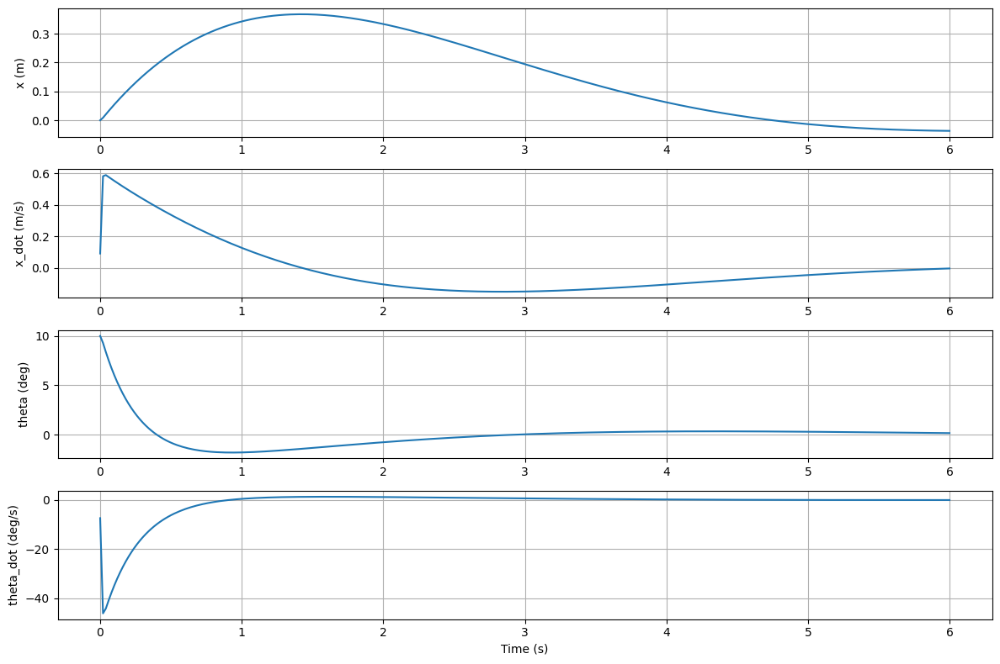

In [21]:
# 애니메이션 비활성화
# ani = animate_cartpole(states)
# from IPython.display import HTML
# HTML(ani.to_jshtml())

# -------------------------------
# 시뮬레이션 결과 시각화
# -------------------------------
time_steps = np.linspace(0, 6, states.shape[0])
x = states[:, 0]
x_dot = states[:, 1]
theta = states[:, 2]
theta_dot = states[:, 3]

plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(time_steps, x)
plt.ylabel('x (m)')
plt.grid(True)

plt.subplot(4, 1, 2)
plt.plot(time_steps, x_dot)
plt.ylabel('x_dot (m/s)')
plt.grid(True)

plt.subplot(4, 1, 3)
plt.plot(time_steps, np.rad2deg(theta))  # 각도를 degree로 변환
plt.ylabel('theta (deg)')
plt.grid(True)

plt.subplot(4, 1, 4)
plt.plot(time_steps, np.rad2deg(theta_dot))
plt.ylabel('theta_dot (deg/s)')
plt.xlabel('Time (s)')
plt.grid(True)

plt.tight_layout()
plt.show()

In [22]:
ani = animate_cartpole(states)

from IPython.display import HTML
HTML(ani.to_jshtml())

## 사용자 정의 Gym 환경 구성 (controller 제거 -> 강화학습이 그 역할을 대신함)

### 환경: 각도, 각속도, 위치, 속도
### 행동: 왼/오른쪽으로 힘을 줘서 밈
### 보상: 카트, 막대를 가운데 오랫동안 위치시키면 +1


In [23]:
!pip install stable-baselines3[extra] gymnasium -q


In [95]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np

class CustomCartPoleEnv(gym.Env):
    metadata = {"render_modes": ["human"], "render_fps": 50}

    def __init__(self):
        super().__init__()
        self.cartpole = CartPole()

        # ✅ 불연속 액션 4개: [ -10, -3, +3, +10 ]
        self.discrete_forces = [-7.0, -3.5, -0.5, 0.5, 3.5, 7.0]
        self.action_space = spaces.Discrete(len(self.discrete_forces))

        high = np.array([np.finfo(np.float32).max] * 4, dtype=np.float32)
        self.observation_space = spaces.Box(-high, high, dtype=np.float32)

        self.max_theta = np.deg2rad(10)
        self.max_x = 2.4
        self.steps_per_action = int(0.005 / self.cartpole.dt)

        self.episode_count = 0
        self.max_curriculum_steps = 10000

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.episode_count += 1
        rng = np.random.default_rng(seed)

        # 커리큘럼 스케일 계산 (루트 스케일 확장)
        progress = min((self.episode_count / self.max_curriculum_steps) ** 0.5, 1.0)

        # 점진적 초기화 범위 설정
        theta_range = np.deg2rad(1 + 9 * progress)
        x_range = 0.05 + 0.45 * progress
        x_dot_range = 0.1 + 0.4 * progress
        theta_dot_range = 0.1 + 0.9 * progress

        x = rng.uniform(low=-x_range, high=x_range)
        x_dot = rng.uniform(low=-x_dot_range, high=x_dot_range)
        theta = rng.uniform(low=-theta_range, high=theta_range)
        theta_dot = rng.uniform(low=-theta_dot_range, high=theta_dot_range)

        self.cartpole.state = np.array([x, x_dot, theta, theta_dot], dtype=np.float32)
        return self.cartpole.state.copy(), {}

    def step(self, action):
        # ✅ 불연속 force mapping
        force = self.discrete_forces[int(action)]

        for _ in range(self.steps_per_action):
            self.cartpole.step(force)

        obs = self.cartpole.state.astype(np.float32)
        x, x_dot, theta, theta_dot = obs

        terminated = abs(x) > self.max_x or abs(theta) > self.max_theta

        # 리워드 함수
        reward = 1.0 \
                 - 0.15 * (x ** 2) \
                 - 0.03 * (x_dot ** 2) \
                 - 2.0 * (theta ** 2) \
                 - 0.3 * (theta_dot ** 2)

        if terminated:
            reward = 0.0

        return obs, reward, terminated, False, {}

    def render(self):
        pass

    def close(self):
        pass

### DQN으로 학습시키기

In [96]:
from stable_baselines3 import DQN
from stable_baselines3.common.vec_env import DummyVecEnv

env = DummyVecEnv([lambda: CustomCartPoleEnv()])

model = DQN("MlpPolicy", env,
            verbose=1,
            learning_rate=1e-3,     # DQN은 보통 좀 더 큰 lr
            buffer_size=50000,
            batch_size=64,
            gamma=0.99,
            train_freq=4,
            target_update_interval=1000,
            exploration_fraction=0.1,
            exploration_final_eps=0.02,
            tensorboard_log="./dqn_cartpole/")

model.learn(total_timesteps=200000)


Using cuda device
Logging to ./dqn_cartpole/DQN_9
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 7491     |
|    time_elapsed     | 0        |
|    total_timesteps  | 98       |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 2483     |
|    time_elapsed     | 0        |
|    total_timesteps  | 160      |
| train/              |          |
|    learning_rate    | 0.001    |
|    loss             | 1.05     |
|    n_updates        | 14       |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 12       |
|    

### 학습된 에이전트 평가 및 시각화

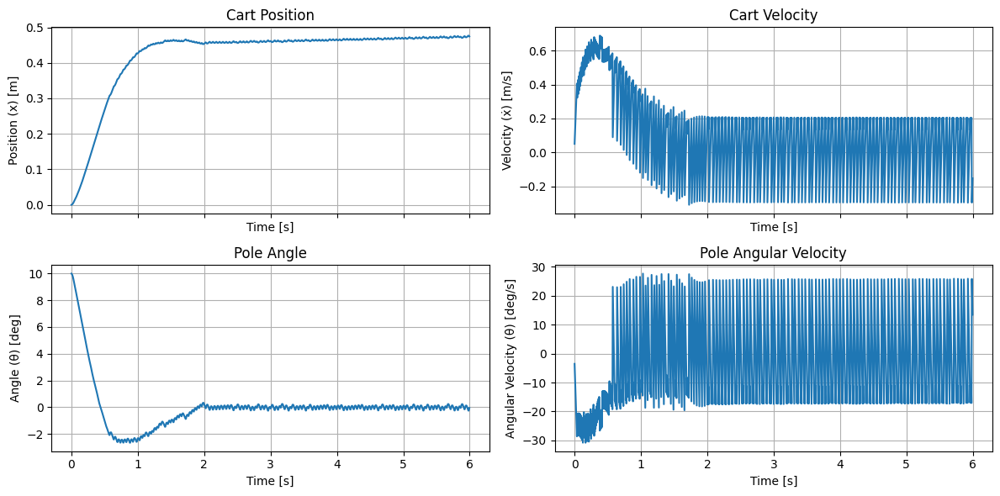

In [97]:
import numpy as np

def animate_cartpole(states, frame_interval=0.1):
    """
    states : (N, 4) numpy array  –  0.1 s마다 샘플링된 결과만 담겨 있어야 함
    frame_interval : 실제 시뮬레이션에서 두 프레임 사이 시간 간격 [sec]
                     → 0.1 (default) ⇒ 10 fps
    """
    import matplotlib.pyplot as plt
    import matplotlib.animation as animation
    import numpy as np

    fig, ax = plt.subplots(figsize=(8, 4))
    ax.set_xlim(-2.5, 2.5)
    ax.set_ylim(-0.5, 1.5)
    ax.set_aspect('equal')
    ax.set_title("CartPole Pendulum Exercise")

    cart_w, cart_h = 0.4, 0.2
    wheel_r = 0.05
    pole_len = 1.0

    cart = plt.Rectangle((0, 0), cart_w, cart_h, color='black')
    wheel_l = plt.Circle((0, 0), wheel_r, color='gray')
    wheel_rgt = plt.Circle((0, 0), wheel_r, color='gray')
    pole_line, = ax.plot([], [], lw=4, color='blue')

    ax.add_patch(cart);  ax.add_patch(wheel_l);  ax.add_patch(wheel_rgt)

    def init():
        cart.set_xy((-cart_w/2, 0))
        wheel_l.center = (-cart_w/4, 0)
        wheel_rgt.center = (cart_w/4, 0)
        pole_line.set_data([], [])
        return cart, wheel_l, wheel_rgt, pole_line

    def update(i):
        x, _, theta, _ = states[i]
        cart.set_xy((x - cart_w/2, 0))
        wheel_l.center = (x - cart_w/4, 0)
        wheel_rgt.center = (x + cart_w/4, 0)

        pole_x = [x, x + pole_len * np.sin(theta)]
        pole_y = [cart_h, cart_h + pole_len * np.cos(theta)]
        pole_line.set_data(pole_x, pole_y)
        return cart, wheel_l, wheel_rgt, pole_line

    # interval(ms) = frame_interval(sec) * 1000
    ani = animation.FuncAnimation(
        fig, update, frames=len(states),
        init_func=init, blit=True,
        interval=int(frame_interval * 1000)
    )
    plt.close()
    return ani

# 결과 시뮬레이션
test_env = CustomCartPoleEnv()
#obs, _ = test_env.reset()
obs, _ =  np.array([0, 0, np.deg2rad(10), 0], dtype=np.float32), {}
done = False
states = []

max_steps = 1200  # 예: 2000 * 0.005 = 10초
steps = 0

while not done and steps < max_steps:
    action, _ = model.predict(obs, deterministic=True)
    obs, _, done, _, _ = test_env.step(action)
    states.append(obs.copy())
    steps += 1

# 시각화
states = np.array(states)
sampled_states = states[::10]
ani = animate_cartpole(sampled_states)

# -----------------------------
# 상태 변화 시각화
# -----------------------------
import matplotlib.pyplot as plt
import numpy as np

# 시간 벡터 생성: 각 step이 0.005초마다 발생
time = np.arange(len(states)) * 0.005


# 상태 분리
x = states[:, 0]                    # 카트 위치
x_dot = states[:, 1]               # 카트 속도
theta = np.rad2deg(states[:, 2])  # 막대 각도 (rad → deg)
theta_dot = np.rad2deg(states[:, 3])  # 막대 각속도

# 그래프 그리기
fig, axs = plt.subplots(2, 2, figsize=(12, 6), sharex=True)

axs[0, 0].plot(time, x)
axs[0, 0].set_ylabel("Position (x) [m]")
axs[0, 0].set_title("Cart Position")

axs[0, 1].plot(time, x_dot)
axs[0, 1].set_ylabel("Velocity (ẋ) [m/s]")
axs[0, 1].set_title("Cart Velocity")

axs[1, 0].plot(time, theta)
axs[1, 0].set_ylabel("Angle (θ) [deg]")
axs[1, 0].set_title("Pole Angle")

axs[1, 1].plot(time, theta_dot)
axs[1, 1].set_ylabel("Angular Velocity (θ̇) [deg/s]")
axs[1, 1].set_title("Pole Angular Velocity")

for ax in axs.flat:
    ax.set_xlabel("Time [s]")
    ax.grid(True)

plt.tight_layout()
plt.show()


from IPython.display import HTML
HTML(ani.to_jshtml())
